# Machine Learning Properati

### PARTE B - Modelos Avanzados

* Elegire tres de los modelos avanzados que se aplicar. Comparare con el desempeño obtenido en el proyecto anterior. Entrénar los modelos y evalúarlos con sus argumentos por defecto.

* Optimizar sus hiperparámetros mediante Validación Cruzada y Grid Search o Random Search.

* Comparar el desempeño de los nuevos modelos entre sí y con el modelo de la Parte A. ¿Cuál elegiría? Justificar.

### PARTE C - Interpretación de modelos

De acuerdo a lo que el modelo permite, respondere algunas o todas las siguientes preguntas:

¿Qué variables fueron relevantes para el modelo para hacer una predicción? ¿Cuáles no? Si use una regresión lineal con regularización, presta atención a los parámetros (pendientes) obtenidas. Si usaste un modelo de ensamble en árboles, además de ver la importancia de cada atributo, también elige algunos árboles al azar y observa qué atributos considera importantes. ¿En qué se diferencian esos árboles? ¿Por qué? Finalmente, responde, ¿coincide con lo que esperabas a partir de tu experiencia con este dataset?

¿Cómo es la distribución de errores (regresión) o qué clases se confunden entre sí (clasificación)? ¿Dónde falla? ¿A qué se debe?

### DESAFÍO OPCIONAL

Aplicar una técnica de Clustering sobre el dataset. ¿Qué clusters encuentras? ¿A qué pueden corresponder? Te dejamos preguntas que pueden servir como disparadoras: ¿qué barrios se parecen más entre sí?¿qué tipos de propiedades se parecen más entre sí?

###  Generación de nuevas variables predictoras/reducción de dimensionalidad (SVD/PCA).

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

Matplotlib is building the font cache; this may take a moment.


In [2]:
df_model=pd.read_csv('C:/Users/Octavio/Documents/CURSOS/DATA SCIENCE/Proyecto/DS_Proyecto_Datos_Properati_procesados.csv')
df_model=df_model.drop(columns='Unnamed: 0')

In [6]:
X=df_model.drop(columns=['price'])
y=df_model[['price']]

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=50)

n_components =  1
explained variance ratio    [0.47734168]
Informacion que contiene este dataset:  47.73416784114738 %

n_components =  2
explained variance ratio    [0.47734168 0.13791611]
Informacion que contiene este dataset:  61.5257792412929 %

n_components =  3
explained variance ratio    [0.47734168 0.13791611 0.1206312 ]
Informacion que contiene este dataset:  73.58889888929852 %

n_components =  4
explained variance ratio    [0.47734168 0.13791611 0.1206312  0.06126597]
Informacion que contiene este dataset:  79.71549617273516 %

n_components =  5
explained variance ratio    [0.47734168 0.13791611 0.1206312  0.06126597 0.05337915]
Informacion que contiene este dataset:  85.05341077381031 %

n_components =  6
explained variance ratio    [0.47734168 0.13791611 0.1206312  0.06126597 0.05337915 0.02122814]
Informacion que contiene este dataset:  87.17622433679342 %

n_components =  7
explained variance ratio    [0.47734168 0.13791611 0.1206312  0.06126597 0.05337915 0.02122812
 0.

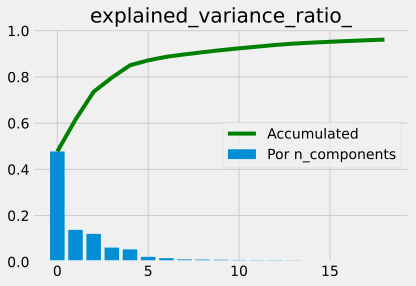

In [8]:
from sklearn.decomposition import PCA
for n in (np.arange(1,20)):
    #Entreno el PCA
    pca = PCA(n_components=n)
    X_train_nuevo=pca.fit_transform(X_train)
    
    
    print('n_components = ',n)
    print('explained variance ratio   ',pca.explained_variance_ratio_)
    print('Informacion que contiene este dataset: ' , pca.explained_variance_ratio_.sum()*100,'%' )
    print()
## ploteo grafico de barras
plt.bar(x=np.arange(n),height=pca.explained_variance_ratio_,label='Por n_components')

## Creo curva acumulada y la ploteo
explained_variance_acc=pd.Series(pca.explained_variance_ratio_).cumsum()
plt.plot(np.arange(n),explained_variance_acc,label='Accumulated',c='g')

plt.title('explained_variance_ratio_')
plt.legend(loc='center right')
plt.show()

Partiendo de un dataset original de 65 columnas.
Podemos ver que 
- El 80% de los datos son explicados con una reducción a dimensión  4
- El 85% de los datos son explicados con una reducción a dimensión 6
- El 90% de los datos son explicados con una reducción a dimensión 9
- El 95% de los datos son explicados con una reducción a dimensión 16





PC  1
surface_covered_rescalado    0.470991
rooms_rescalado              0.462355
bedrooms_rescalado           0.458699
surface_total_rescalado      0.448903
bathrooms_rescalado          0.383016
Name: 0, dtype: float64


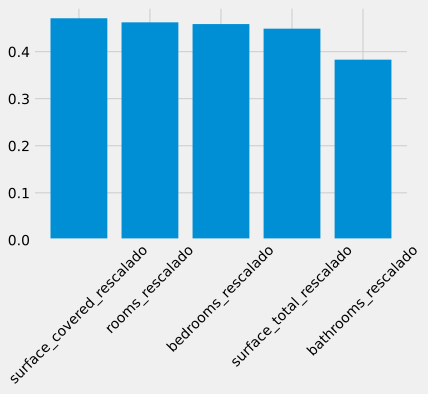

PC  2
lat_rescalado          0.757496
l3_Belgrano            0.103118
bathrooms_rescalado    0.096786
l3_Villa Urquiza       0.057103
l3_Nuñez               0.042946
Name: 1, dtype: float64


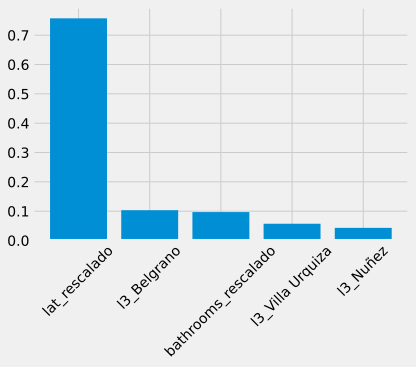

PC  3
property_type_PH           0.105683
bedrooms_rescalado         0.072782
surface_total_rescalado    0.070604
rooms_rescalado            0.059313
l3_Caballito               0.047439
Name: 2, dtype: float64


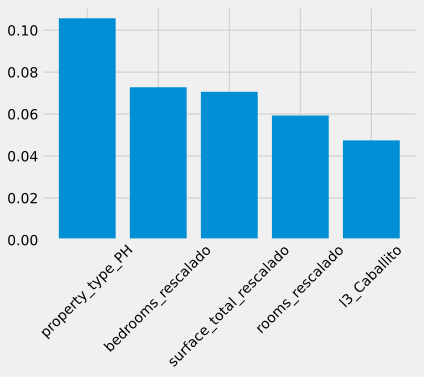

PC  4
bathrooms_rescalado           0.744944
surface_total_rescalado       0.129853
surface_covered_rescalado     0.103586
property_type_Departamento    0.059070
l3_Caballito                  0.040334
Name: 3, dtype: float64


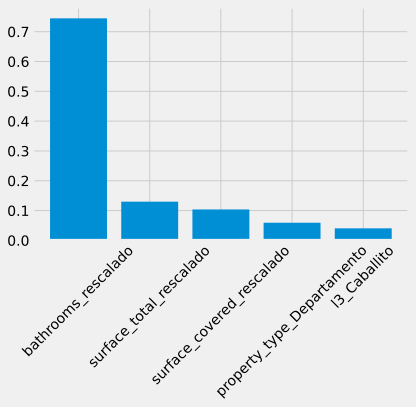

PC  5
surface_total_rescalado      0.597001
surface_covered_rescalado    0.413924
lon_rescalado                0.078982
property_type_PH             0.074316
lat_rescalado                0.073097
Name: 4, dtype: float64


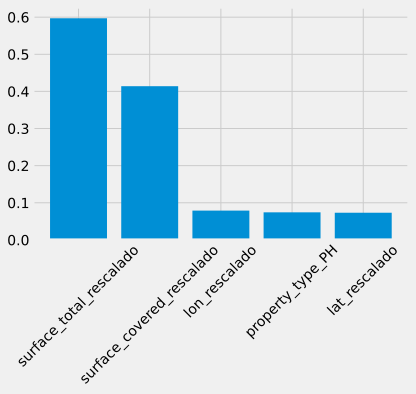

PC  6
property_type_Departamento    0.662959
surface_covered_rescalado     0.184320
l3_Caballito                  0.060042
l3_Belgrano                   0.056649
l3_Recoleta                   0.043509
Name: 5, dtype: float64


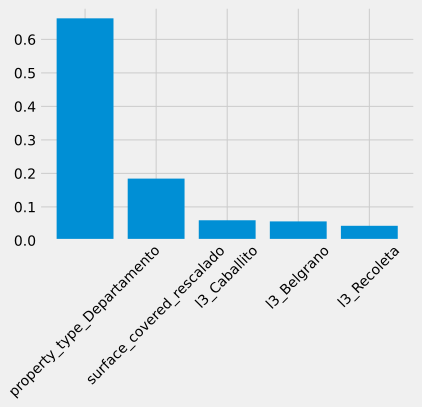

PC  7
l3_Palermo                    0.927216
property_type_Departamento    0.092165
rooms_rescalado               0.023073
surface_total_rescalado       0.020732
l3_Flores                     0.016177
Name: 6, dtype: float64


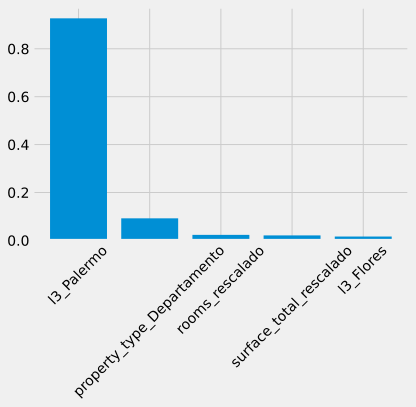

PC  8
l3_Almagro                    0.638678
surface_total_rescalado       0.431655
bedrooms_rescalado            0.164772
property_type_Departamento    0.063036
l3_Belgrano                   0.032374
Name: 7, dtype: float64


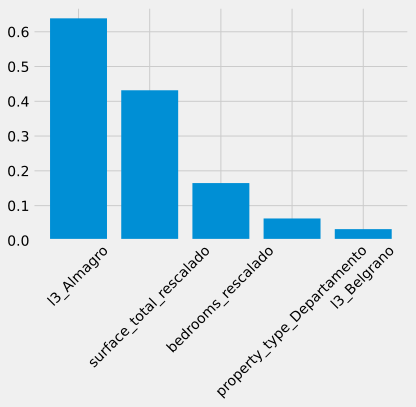

PC  9
surface_total_rescalado    0.444142
l3_Villa Crespo            0.250536
bedrooms_rescalado         0.167259
l3_Caballito               0.133363
l3_Belgrano                0.062389
Name: 8, dtype: float64


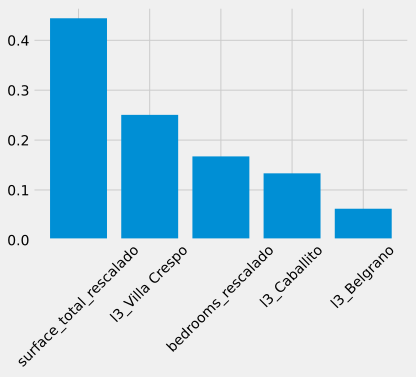

PC  10
l3_Villa Crespo               0.805288
l3_Almagro                    0.186578
l3_Palermo                    0.042471
property_type_Departamento    0.036786
bathrooms_rescalado           0.028248
Name: 9, dtype: float64


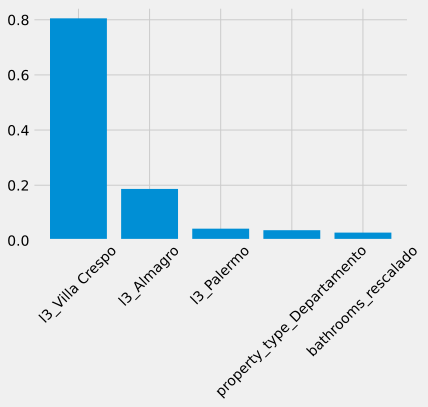

In [10]:
n=10
pca = PCA(n_components=n)
X_train_nuevo=pca.fit_transform(X_train)

components_pc=pd.DataFrame(data=pca.components_,columns=X.columns,index=np.arange(n))
components_pc=components_pc.transpose()
for i in range(n):
    pc=components_pc.sort_values(by=i,ascending=False).abs().iloc[0:5,i]

    print('PC ' , i+1)
    print(pc)
    plt.bar(x=pc.index,height=pc)
    plt.xticks(rotation=45)
    plt.show()


En los graficos de arriba podemos ver cuales son las variables que más influencia tienen en cada Principal component. Donde figuran todas las variables que más información tienen 

**Utilizaremos un dataset reducido a dimensionalidad 9**

In [15]:
n=9
pca = PCA(n_components=n)
X_train_new=pca.fit_transform(X_train)
X_test_new=pca.transform(X_test)
X_train=pd.DataFrame(X_train_new,index=X_train.index,columns=np.arange(1,n+1))
X_test=pd.DataFrame(X_test_new,index=X_test.index,columns=np.arange(1,n+1))


In [16]:
X_train.shape

(55076, 9)

In [19]:
X_train.merge(y_train,how='inner',left_index=True,right_index=True)

,1,2,3,4,5,6,7,8,9,price
33132,-1.875696,-0.071629,0.244688,0.122131,-0.013523,0.114942,-0.171181,-0.316635,0.234415,82000.0
11273,-0.390136,-0.284173,0.186471,-0.545984,0.004686,0.269646,-0.047315,-0.050618,0.015029,205000.0
54999,-1.725663,-1.116203,-0.593220,0.090793,0.179373,0.008761,-0.126310,-0.056636,0.037622,97000.0
9630,1.496047,0.283211,-0.782986,-0.445601,-0.660242,-0.021915,0.820300,-0.019499,-0.050377,149000.0
22546,0.907096,-0.890049,1.752451,1.169478,0.066751,0.416859,0.146757,0.101301,0.096065,250000.0
...,...,...,...,...,...,...,...,...,...,...
55366,1.785262,2.275505,0.044916,-0.390652,-0.210084,0.185340,-0.071304,0.584331,0.603180,285000.0
59358,0.199053,1.086933,-0.451882,0.287933,-0.484310,0.015474,-0.133832,0.049345,0.074050,245000.0
48417,-1.518966,-0.216388,-0.968496,-0.036882,0.470156,0.078487,-0.327095,-0.302189,-0.009442,194000.0
22637,2.590213,-1.287965,-0.582376,-1.035624,-1.140125,0.163710,-0.056501,-0.003312,0.152826,220000.0


In [18]:
sns.pairplot(X_train.merge(y_train,how='inner',left_index=True,right_index=True))


## PARTE B - Modelos Avanzados

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.metrics import mean_squared_error
from sklearn import preprocessing

## Continuamos reentrenando el modelo del proyecto 1 con los datos preprocesados e incluyendo los datos categoricos y vemos como mejora la perfomance:

#### Tenemos en cuenta que el RMSE del proyecto 1 para este tree fue de: *USD 160 000*

In [21]:
tree_regressor=DecisionTreeRegressor(max_depth=6,random_state=1)
tree_regressor.fit(X_train,y_train)
   
y_train_pred=tree_regressor.predict(X_train)
rmse_train= np.sqrt(mean_squared_error(y_train, y_train_pred))

y_test_pred=tree_regressor.predict(X_test)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print(f'Errores RMSE Tree:    Train: {rmse_train} Test: {rmse_test}')

Errores RMSE Tree:    Train: 77996.08380920619 Test: 80674.71486984564


Podemos ver que el error bajo de 160 000 a 80 600 con el pre-procesamiento de  los datos

#### Evaluar feature importances

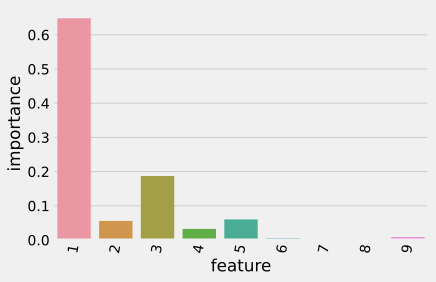

In [23]:
importance = list(tree_regressor.feature_importances_)
features = list(X_train.columns)

d={'feature':features,'importance':importance}

df_importances=pd.DataFrame(data=d)


##Grafico
#plt.figure(figsize=[16,8])
sns.barplot(data=df_importances.sort_values(by=['importance'],ascending=False),x='feature',y='importance')
plt.xticks(rotation=80)
plt.show()

## Continuamos con modelos avanzados

Elige dos de los modelos avanzados vistos Compara con el desempeño obtenido en el proyecto 01 (en el caso de regresión, considera una regresión lineal con atributos polinómicos y regularización). Entrénalos y evalúalos con sus argumentos por defecto. No te olvides de hacer un train/test split y usar Validación Cruzada.

Optimiza sus hiperparámetros mediante Validación Cruzada y Grid Search o Random Search.

Compara el desempeño de los nuevos modelos entre sí y con el modelo de la Parte A. ¿Cuál elegirías? Justifica.

### Utilizaremos regresion, Random Forest y ADA Boost con un Tree Regressor

Importamos modelos

In [53]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
#Agregar todo aca

In [25]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge, Lasso


Definimos una funcion para evaluar la regresion

In [26]:
from sklearn.metrics import mean_squared_error
def evaluar_regresion(model, X_train, X_test, y_train, y_test):

    model.fit(X_train,y_train)
    
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    ### CALCULAMOS EL ERROR
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

    print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
    print(f'Raíz del error cuadrático medio en Test: {rmse_test}')

    plt.figure(figsize=[10,5])
    plt.subplot(1,2,1)
    #Grafico de distribucion de errores
    sns.distplot(y_train - y_train_pred.reshape(y_train.shape), bins = 20, label = 'train')
    sns.distplot(y_test - y_test_pred.reshape(y_test.shape), bins = 20, label = 'test')
    plt.xlabel('errores')
    plt.legend()
    
    
    ax = plt.subplot(1,2,2)
    #graficos scatter entre datos reales y predichos
    ax.scatter(y_test,y_test_pred, s =2)

    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    #agrega linea diagonal a la escala de los ejes.
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')

    plt.tight_layout()
    plt.show()

Realizamos una regresion con Lasso para distintos alphas, para polynomial features 1 y 2 y  con Cross Validation y elegimos el mejor modelo para entrenarlo y obtener el error del Train y Test

In [27]:
reg_lasso = Lasso()
reg_ridge= Ridge()
for i in [1,2]:
    
    ## APLICAMOS POLYNOMIAL FEATURE A NUESTROS DATOS
    print('polynomial degree = ', i)
    poly = PolynomialFeatures(degree = i, include_bias=False) ### ACA TENDRAS QUE MODIFICAR MAS ADELANTE
    X_train_new = poly.fit_transform(X_train)
    X_test_new = poly.fit_transform(X_test)
    
    ## CREAMOS GRID SEARCH SOLO PARA ALPHA
    model=GridSearchCV(reg_lasso,{'alpha':[0.05,0.1,0.25,0.5,1,1.5]},cv=4,scoring='neg_mean_absolute_error')

    ## FITEAMOS EL MODELO
    model.fit(X_train_new,y_train)
    

    
    ##OBTENEMOS MEJOR MODELO
    print("Mejor Score: "+str(model.best_score_)+'\n')
    print(str(model.best_estimator_))

    scores = pd.DataFrame(model.cv_results_)
    #scores.head()
    #print(scores[scores['mean_test_score']==scores['mean_test_score'].max()])
    

    
    


polynomial degree =  1
Mejor Score: -57855.22678433074

Lasso(alpha=1.5)
polynomial degree =  2


C:\Users\Octavio\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 109218694985934.69, tolerance: 114964582436.86864
  model = cd_fast.enet_coordinate_descent(
C:\Users\Octavio\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 109983260020828.75, tolerance: 117275869291.55128
  model = cd_fast.enet_coordinate_descent(
C:\Users\Octavio\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 109653985720540.62, tolerance: 115145645748.32985
  model = cd_fast.enet_coordinate_descent(
C:\Users\Octavio\miniconda3\envs\datascienc

Mejor Score: -47303.932014841244

Lasso(alpha=1.5)


C:\Users\Octavio\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15253131879220.312, tolerance: 154559217241.91614
  model = cd_fast.enet_coordinate_descent(


Entrenamos con mejor modelo

In [32]:
poly = PolynomialFeatures(degree = 2, include_bias=False)
X_train_new = poly.fit_transform(X_train)
X_test_new = poly.fit_transform(X_test)
reg_lasso = Lasso(alpha= 1.5,tol=0.001)


Podemos ver que en el caso de Regresion lineal con Polynomial features de grado = 2 y regularizacion Lasso con alpha = 1.5 tenemos los siguientes errores

In [33]:
evaluar_regresion(reg_lasso, X_train_new, X_test_new, y_train, y_test)

C:\Users\Octavio\miniconda3\envs\datascience\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15253131879220.312, tolerance: 1545592172419.1614
  model = cd_fast.enet_coordinate_descent(
C:\Users\Octavio\miniconda3\envs\datascience\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Raíz del error cuadrático medio en Train: 75725.08011510747
Raíz del error cuadrático medio en Test: 76752.78051242452


C:\Users\Octavio\miniconda3\envs\datascience\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Hay un error de 76000 USD promedio entre el test y train set, ambos estan muy cerca uno del otro, lo que significa que el modelo predice bien.
Este error es 4000 USD mas chico que el de un arbol de decision simple, reduciendo el error un 5%


### Con RANDOM FOREST 

In [34]:
from sklearn.ensemble import RandomForestRegressor


In [42]:
regr=RandomForestRegressor(n_estimators=100,n_jobs=-1,random_state=1,oob_score=True)
regr.fit(X_train,np.ravel(y_train))

regr.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))

print("Root mean squared error: ",rmse_train)
print("Oob_score: ",regr.oob_score_) #Ni idea que score es esto creo que es R^2

Root mean squared error:  114352.18248432566
Oob_score:  0.9206174621139629


In [49]:
regr=RandomForestRegressor()

## hacemos grilla con hiperparametros
param_grid={'n_estimators':np.arange(30,100),
            'max_depth':[100,150,None]} #
## configuramos Random Search
model=RandomizedSearchCV(regr,param_grid,n_iter=20,scoring='neg_mean_absolute_error',cv=6,random_state=42,n_jobs= -1)

##FITEAMOS
model.fit(X_train,np.ravel(y_train))

##OBTENEMOS MEJOR MODELO
print("Mejor Score: "+str(model.best_score_)+'\n')
print(str(model.best_estimator_))

scores = pd.DataFrame(model.cv_results_)
#scores.head()
scores[scores['mean_test_score']==scores['mean_test_score'].max()]
    


Mejor Score: -23254.76664460762

RandomForestRegressor(max_depth=150, n_estimators=96)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,mean_test_score,std_test_score,rank_test_score
10,105.683055,3.546427,0.616564,0.082529,96,150,"{'n_estimators': 96, 'max_depth': 150}",-23866.183871,-23694.629935,-23203.468978,-23000.559578,-23099.479854,-22664.277652,-23254.766645,409.746804,1


In [55]:
# Evaluamos con el TRAIN y TEST SET 
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)
    
### CALCULAMOS EL ERROR
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test}')

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
#Grafico de distribucion de errores
plt.hist(y_train - y_train_pred.reshape(y_train.shape), bins = 20, label = 'train')
plt.hist(y_test - y_test_pred.reshape(y_test.shape), bins = 20, label = 'test')
plt.xlabel('errores')
plt.legend()
    
    
ax = plt.subplot(1,2,2)
#graficos scatter entre datos reales y predichos

ax.scatter(y_test,y_test_pred, s =2,c='r',label='test')
ax.scatter(y_train,y_train_pred, s =2,c='b',label='train')
lims = [
np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
]
#agrega linea diagonal a la escala de los ejes.
ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.xlabel('y (test)')
plt.ylabel('y_pred (test)')
plt.legend()

plt.tight_layout()
plt.show()

Raíz del error cuadrático medio en Train: 18791.308015979925
Raíz del error cuadrático medio en Test: 47478.3385840201


Podemos decir que el modelo esta overfitteado ya que la diferencia entre el error del Train y del Test es de un 60% mas grande para el Test, y en amnbos graficos se ve como el conjunto Train tiene menos error que el conjunto Test. 
Al haberse realziado una cross validation se puede suponer que el dificilmente se logre un modelo sin este overfittting.
Como ventaja tiene que el error es significativamente menor a los otros modelos, teniendo un error de 
- 18800 USD en el TRAIN siendo un 77% menor al TreeDecissionRegressor del Benchmark
- 47500 USD en el TEST siendo un 41% menor al Tree DecissionRegressor del Benchmark